In [166]:
import pandas as pd
import matplotlib.pyplot as plt

In [167]:
!unzip itmo_os_lab5_compressed.zip

Archive:  itmo_os_lab5_compressed.zip
   creating: itmo_os_lab5/
   creating: itmo_os_lab5/cpu/
  inflating: itmo_os_lab5/cpu/int16_cpu_res  
  inflating: itmo_os_lab5/cpu/int64_cpu_res  
  inflating: itmo_os_lab5/cpu/int16_sched_res  
  inflating: itmo_os_lab5/cpu/int64_sched_res  
  inflating: itmo_os_lab5/cpu/int16  
  inflating: itmo_os_lab5/cpu/int64  
   creating: itmo_os_lab5/cache/
  inflating: itmo_os_lab5/cache/l1cache-sets  
  inflating: itmo_os_lab5/cache/cache-fence  
  inflating: itmo_os_lab5/cache/cache-fence_without_res  
  inflating: itmo_os_lab5/cache/cache-fence_res  
  inflating: itmo_os_lab5/cache/l1cache-sets_cpu_res  
  inflating: itmo_os_lab5/cache/l1cache-sets_res  
   creating: itmo_os_lab5/pipe/
  inflating: itmo_os_lab5/pipe/pipeherd  
  inflating: itmo_os_lab5/pipe/pipeherd_res  
  inflating: itmo_os_lab5/pipe/pipeherd_cpu_res  
  inflating: itmo_os_lab5/pipe/pipe-ops  
  inflating: itmo_os_lab5/pipe/pipe-ops_res  
  inflating: itmo_os_lab5/pipe/pipe-ops_cp

In [168]:
def plot_stress_ng_res(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].set_xlabel("cpus_count")
    axs[0].set_ylabel("bogo_ops")
    axs[0].plot(data["cpus_count"], data["bogo_ops"])
    axs[0].set_title(title + " stress-ng res (bogo_ops)")

    axs[1].set_xlabel("cpus_count")
    axs[1].set_ylabel("cpu_used")
    axs[1].plot(data["cpus_count"], data["cpu_used"])
    axs[1].set_title(title + " stress-ng res (cpu_used)")


def plot_sched_res(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].set_ylabel("bogo_ops")
    axs[0].bar(data["policy"], data["bogo_ops"])
    axs[0].set_title(title + " stress-ng sched res (bogo_ops)")

    axs[1].set_ylabel("cpu_used")
    axs[1].bar(data["policy"], data["cpu_used"])
    axs[1].set_title(title + " stress-ng sched res (cpu_used)")


def plot_sets_count_res(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].set_xlabel("sets_count")
    axs[0].set_ylabel("bogo_ops")
    axs[0].plot(data["sets_count"], data["bogo_ops"])
    axs[0].set_title(title + " sets count res (bogo_ops)")

    axs[1].set_xlabel("sets_count")
    axs[1].set_ylabel("cpu_used")
    axs[1].plot(data["sets_count"], data["cpu_used"])
    axs[1].set_title(title + " sets count res (cpu_used)")


def plot_io_res(data, title, cpus_count):
    fig, axs = plt.subplots(2, 1, figsize=(12, 24))

    axs[0].set_title(title + " io res (read)")
    axs[0].set_ylabel("kB_read/s")

    axs[1].set_title(title + " io res (write)")
    axs[1].set_ylabel("kB_write/s")

    for cpu_count in cpus_count:
        read_subdata = data[data["cpus_count"] == cpu_count]["kB_read/s"]
        axs[0].plot([i for i in range(0, len(read_subdata))], read_subdata, label=str(cpu_count))
        write_subdata = data[data["cpus_count"] == cpu_count]["kB_write/s"]
        axs[1].plot([i for i in range(0, len(write_subdata))], write_subdata, label=str(cpu_count))

    axs[0].legend(title="cpus_count")
    axs[1].legend(title="cpus_count")


def plot_cpu_res(data, title, cpus_count):
    fig, axs = plt.subplots(3, 1, figsize=(12, 36))

    axs[0].set_title(title + " cpu res (usr)")
    axs[0].set_ylabel("%usr")

    axs[1].set_title(title + " cpu res (sys)")
    axs[1].set_ylabel("%sys")

    axs[2].set_title(title + " cpu res (iowait)")
    axs[2].set_ylabel("%iowait")

    for cpu_count in cpus_count:
        usr_subdata = data[data["cpus_count"] == cpu_count]["usr"]
        axs[0].plot([i for i in range(0, len(usr_subdata))], usr_subdata, label=str(cpu_count))
        sys_subdata = data[data["cpus_count"] == cpu_count]["sys"]
        axs[1].plot([i for i in range(0, len(sys_subdata))], sys_subdata, label=str(cpu_count))
        iowait_subdata = data[data["cpus_count"] == cpu_count]["iowait"]
        axs[2].plot([i for i in range(0, len(iowait_subdata))], iowait_subdata, label=str(cpu_count))

    axs[0].legend(title="cpus_count")
    axs[1].legend(title="cpus_count")
    axs[2].legend(title="cpus_count")


def plot_mem_level_cpu_res(data, title, mem_levels):
    fig, axs = plt.subplots(3, 1, figsize=(12, 36))

    axs[0].set_title(title + " mem level cpu res (usr)")
    axs[0].set_ylabel("%usr")

    axs[1].set_title(title + " mem level cpu res (sys)")
    axs[1].set_ylabel("%sys")

    axs[2].set_title(title + " mem level cpu res (iowait)")
    axs[2].set_ylabel("%iowait")

    for mem_level in mem_levels:
        usr_subdata = data[data["mem-level"] == mem_level]["usr"]
        axs[0].plot([i for i in range(0, len(usr_subdata))], usr_subdata, label=str(mem_level))
        sys_subdata = data[data["mem-level"] == mem_level]["sys"]
        axs[1].plot([i for i in range(0, len(sys_subdata))], sys_subdata, label=str(mem_level))
        iowait_subdata = data[data["mem-level"] == mem_level]["iowait"]
        axs[2].plot([i for i in range(0, len(iowait_subdata))], iowait_subdata, label=str(mem_level))

    axs[0].legend(title="mem_level")
    axs[1].legend(title="mem_level")
    axs[2].legend(title="mem_level")



def plot_mem_level_res(data, title):
    fig, axs = plt.subplots(2, 2, figsize=(12, 12))

    axs[0][0].set_xlabel("mem_level")
    axs[0][0].set_ylabel("bogo_ops")
    axs[0][0].plot(data["mem-level"], data["bogo_ops"])
    axs[0][0].set_title(title + " mem level res (bogo_ops)")

    axs[0][1].set_xlabel("mem_level")
    axs[0][1].set_ylabel("cpu_used")
    axs[0][1].plot(data["mem-level"], data["cpu_used"])
    axs[0][1].set_title(title + " mem level res (cpu_used)")

    axs[1][0].set_xlabel("mem_level")
    axs[1][0].set_ylabel("comp_ratio")
    axs[1][0].plot(data["mem-level"], data["comp_ratio"])
    axs[1][0].set_title(title + " mem level res (comp_ratio)")

    axs[1][1].set_xlabel("mem_level")
    axs[1][1].set_ylabel("comp_rate")
    axs[1][1].plot(data["mem-level"], data["comp_rate"])
    axs[1][1].set_title(title + " mem level res (comp_rate)")


def plot_vm_res(data, title, cpus_count):
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))

    ax.set_title(title + " vm res (free)")
    ax.set_ylabel("free")

    for cpu_count in cpus_count:
        subdata = data[data["cpus_count"] == cpu_count]["free"]
        ax.plot([i for i in range(0, len(subdata))], subdata, label=str(cpu_count))

    ax.legend(title="cpus_count")


def plot_deadline_res(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].set_xlabel("deadline")
    axs[0].set_ylabel("bogo_ops")
    axs[0].plot(data["deadline"], data["bogo_ops"])
    axs[0].set_title(title + " deadline res (bogo_ops)")

    axs[1].set_xlabel("deadline")
    axs[1].set_ylabel("cpu_used")
    axs[1].plot(data["deadline"], data["cpu_used"])
    axs[1].set_title(title + " deadline res (cpu_used)")


def plot_priority_res(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].set_xlabel("priority")
    axs[0].set_ylabel("bogo_ops")
    axs[0].plot(data["priority"], data["bogo_ops"])
    axs[0].set_title(title + " priority res (bogo_ops)")

    axs[1].set_xlabel("priority")
    axs[1].set_ylabel("cpu_used")
    axs[1].plot(data["priority"], data["cpu_used"])
    axs[1].set_title(title + " priority res (cpu_used)")


def plot_deadline_cpu_res(data, title, deadlines):
    fig, axs = plt.subplots(3, 1, figsize=(12, 36))

    axs[0].set_title(title + " deadline cpu res (usr)")
    axs[0].set_ylabel("%usr")

    axs[1].set_title(title + " deadline cpu res (sys)")
    axs[1].set_ylabel("%sys")

    axs[2].set_title(title + " deadline cpu res (iowait)")
    axs[2].set_ylabel("%iowait")

    for deadline in deadlines:
        usr_subdata = data[data["deadline"] == deadline]["usr"]
        axs[0].plot([i for i in range(0, len(usr_subdata))], usr_subdata, label=str(deadline))
        sys_subdata = data[data["deadline"] == deadline]["sys"]
        axs[1].plot([i for i in range(0, len(sys_subdata))], sys_subdata, label=str(deadline))
        iowait_subdata = data[data["deadline"] == deadline]["iowait"]
        axs[2].plot([i for i in range(0, len(iowait_subdata))], iowait_subdata, label=str(deadline))

    axs[0].legend(title="deadline")
    axs[1].legend(title="deadline")
    axs[2].legend(title="deadline")


def plot_priority_cpu_res(data, title, priorities):
    fig, axs = plt.subplots(3, 1, figsize=(12, 36))

    axs[0].set_title(title + " priority cpu res (usr)")
    axs[0].set_ylabel("%usr")

    axs[1].set_title(title + " priority cpu res (sys)")
    axs[1].set_ylabel("%sys")

    axs[2].set_title(title + " priority cpu res (iowait)")
    axs[2].set_ylabel("%iowait")

    for priority in priorities:
        usr_subdata = data[data["priority"] == priority]["usr"]
        axs[0].plot([i for i in range(0, len(usr_subdata))], usr_subdata, label=str(priority))
        sys_subdata = data[data["priority"] == priority]["sys"]
        axs[1].plot([i for i in range(0, len(sys_subdata))], sys_subdata, label=str(priority))
        iowait_subdata = data[data["priority"] == priority]["iowait"]
        axs[2].plot([i for i in range(0, len(iowait_subdata))], iowait_subdata, label=str(priority))

    axs[0].legend(title="priority")
    axs[1].legend(title="priority")
    axs[2].legend(title="priority")


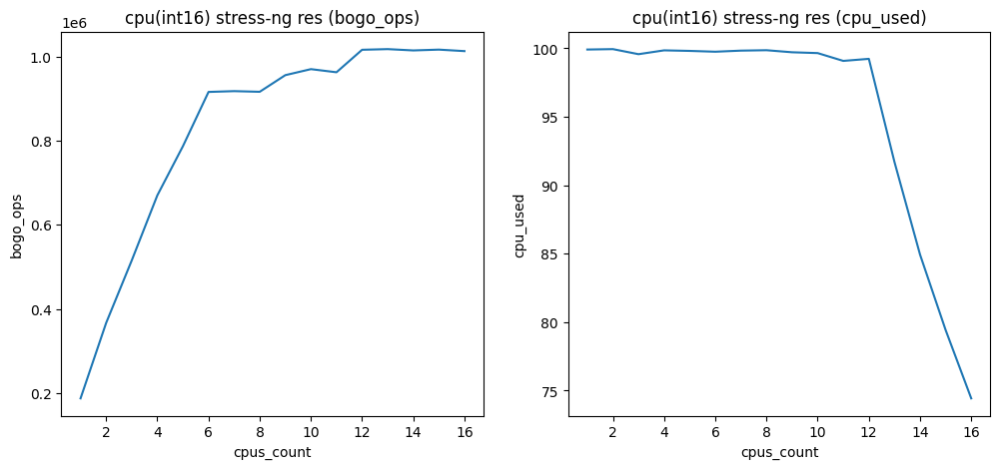

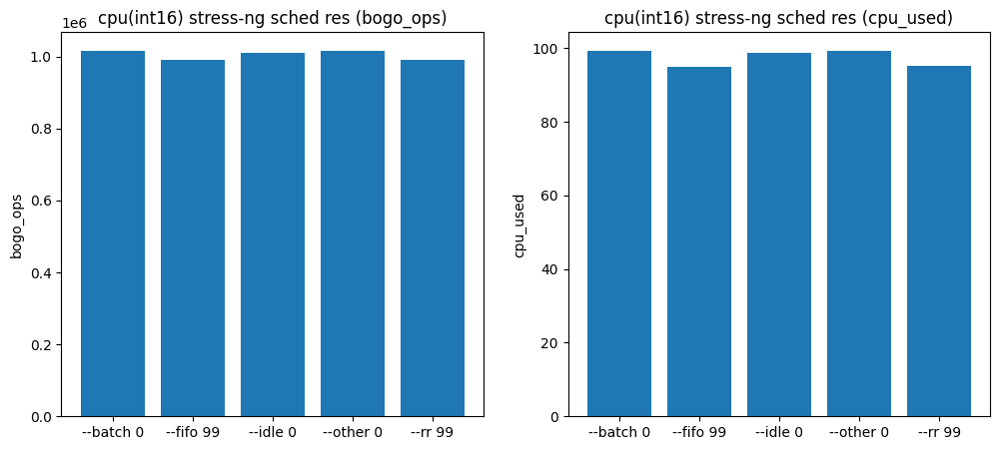

In [169]:
#cpu int16
int16_cpu_res = pd.read_csv("itmo_os_lab5/cpu/int16_cpu_res", delimiter = ',')
int16_sched_res = pd.read_csv("itmo_os_lab5/cpu/int16_sched_res", delimiter = ',')

plot_stress_ng_res(int16_cpu_res, "cpu(int16)")
plot_sched_res(int16_sched_res, "cpu(int16)")

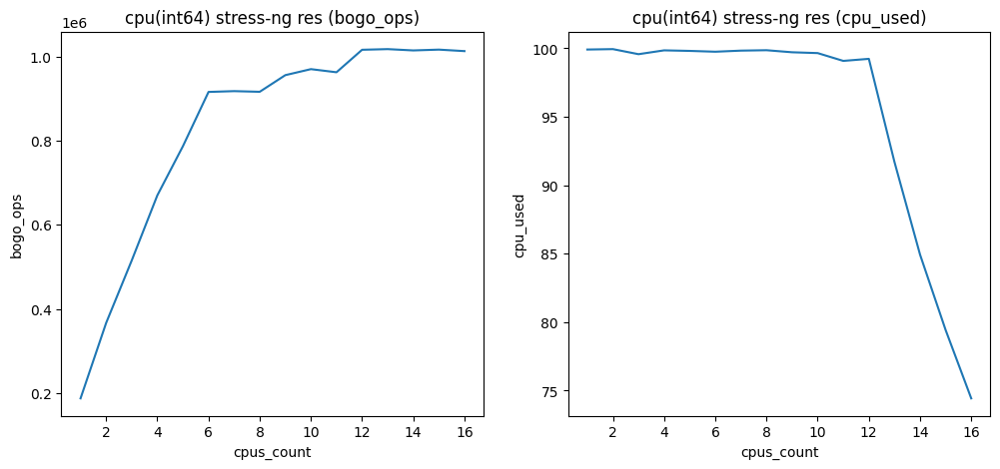

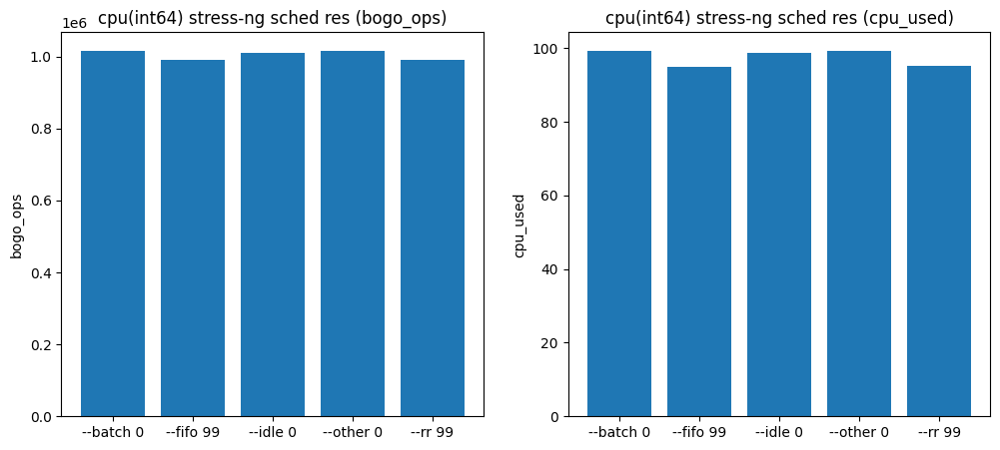

In [170]:
#cpu int64
int64_cpu_res = pd.read_csv("itmo_os_lab5/cpu/int64_cpu_res", delimiter = ',')
int64_sched_res = pd.read_csv("itmo_os_lab5/cpu/int64_sched_res", delimiter = ',')

plot_stress_ng_res(int16_cpu_res, "cpu(int64)")
plot_sched_res(int16_sched_res, "cpu(int64)")

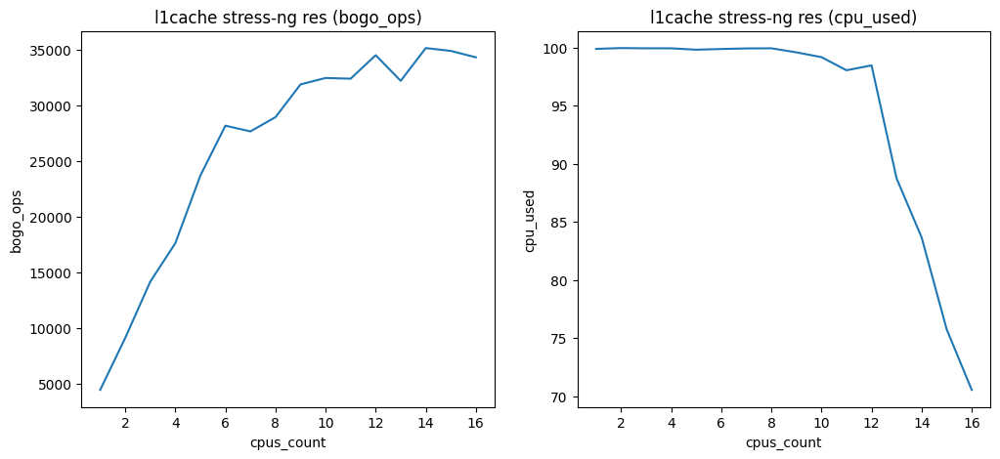

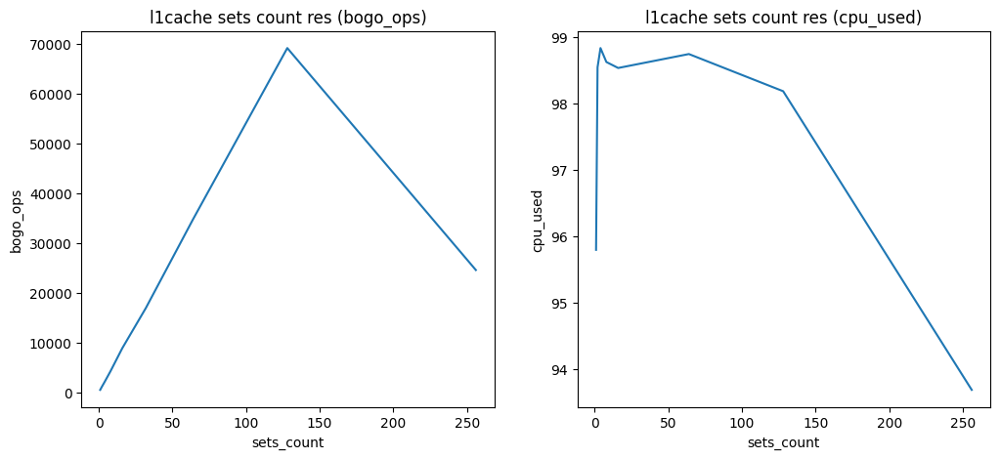

In [171]:
#cache l1cache-sets
l1cache_sets_cpu_res = pd.read_csv("itmo_os_lab5/cache/l1cache-sets_cpu_res", delimiter = ',')
l1cache_sets_res = pd.read_csv("itmo_os_lab5/cache/l1cache-sets_res", delimiter = ',')

plot_stress_ng_res(l1cache_sets_cpu_res, "l1cache")
plot_sets_count_res(l1cache_sets_res, "l1cache")

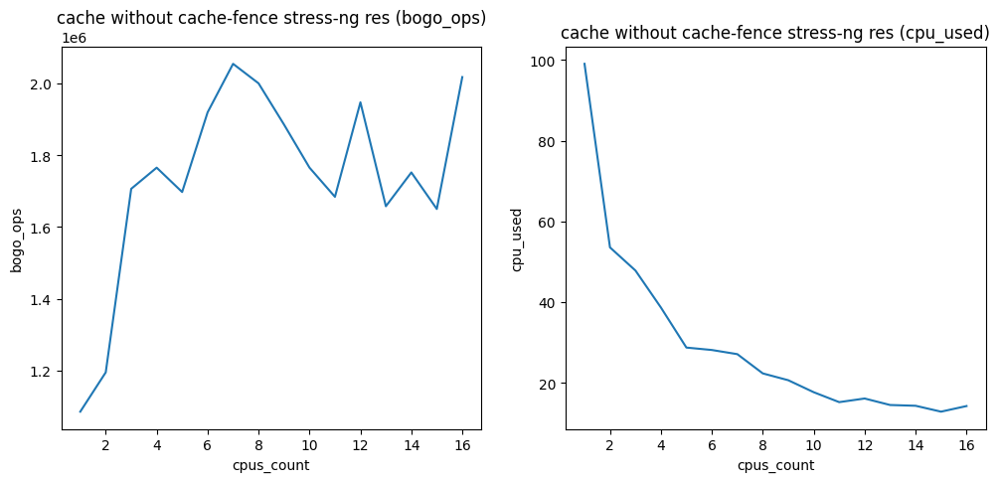

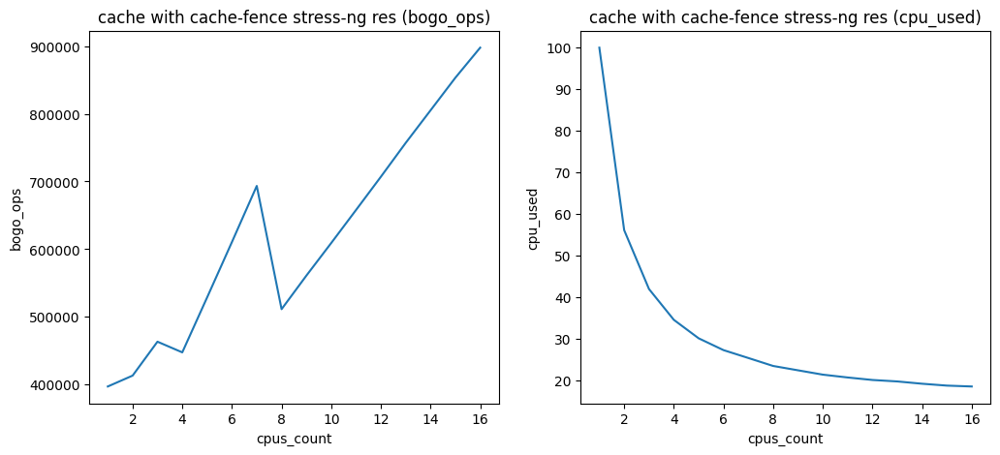

In [172]:
#cache cache-fence
cache_fence_res = pd.read_csv("itmo_os_lab5/cache/cache-fence_res", delimiter = ',')
cache_fence_without_res = pd.read_csv("itmo_os_lab5/cache/cache-fence_without_res", delimiter = ',')

plot_stress_ng_res(cache_fence_without_res, "cache without cache-fence")
plot_stress_ng_res(cache_fence_res, "cache with cache-fence")

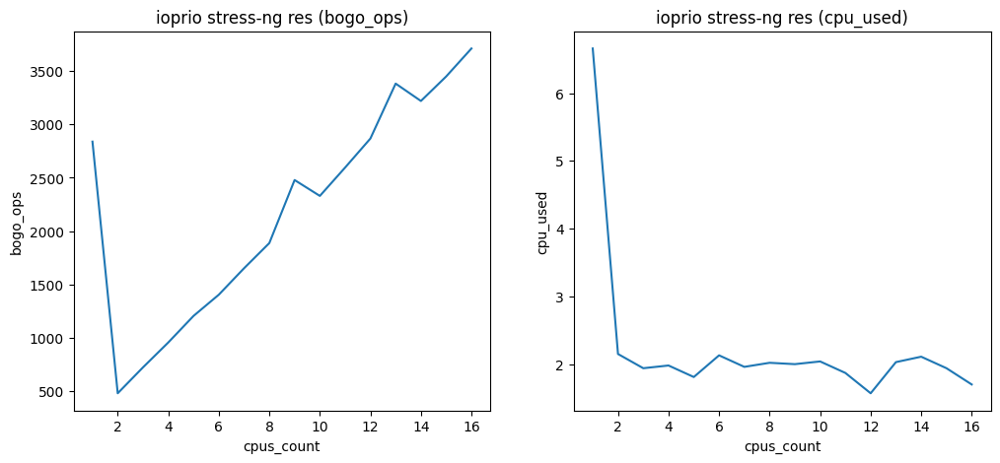

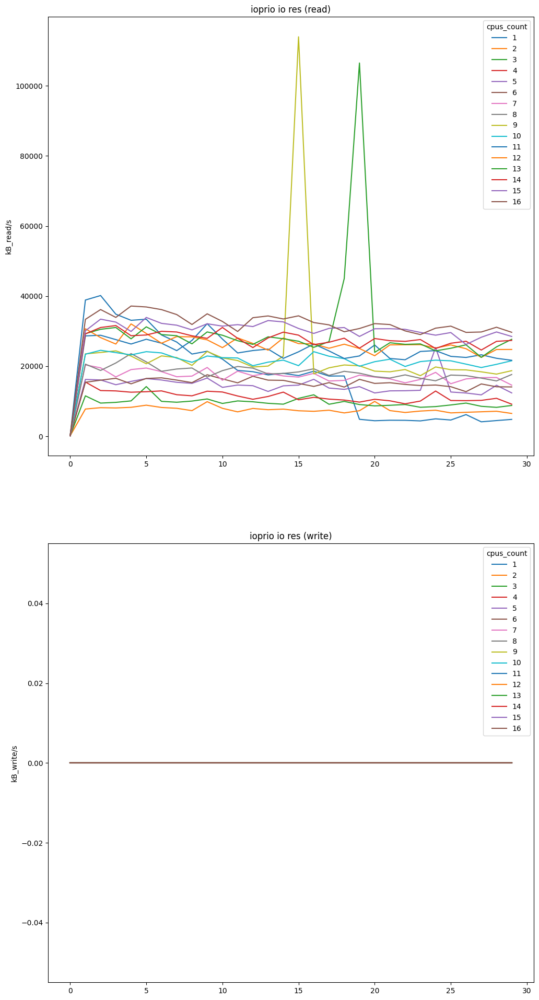

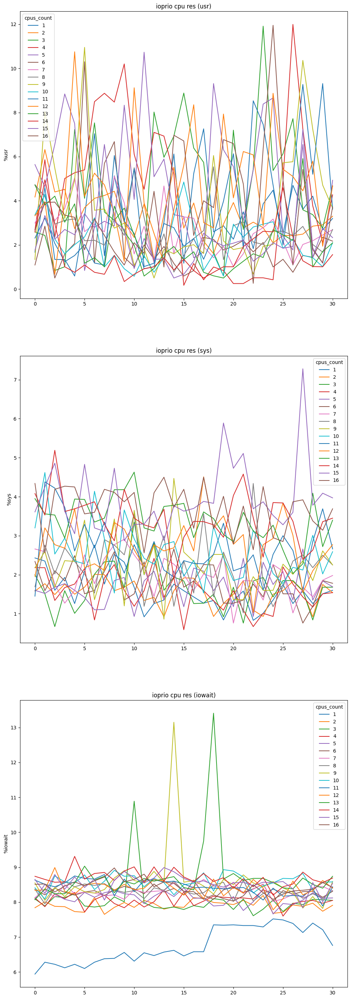

In [173]:
#io ioprio
ioprio_res = pd.read_csv("itmo_os_lab5/io/ioprio_res", delimiter=',')
ioprio_io_res = pd.read_csv("itmo_os_lab5/io/ioprio_io_res", delimiter=',')
ioprio_cpu_res = pd.read_csv("itmo_os_lab5/io/ioprio_cpu_res", delimiter=',')

plot_stress_ng_res(ioprio_res, "ioprio")
plot_io_res(ioprio_io_res, "ioprio", [i for i in range(1, 17, 1)])
plot_cpu_res(ioprio_cpu_res, "ioprio", [i for i in range(1, 17, 1)])

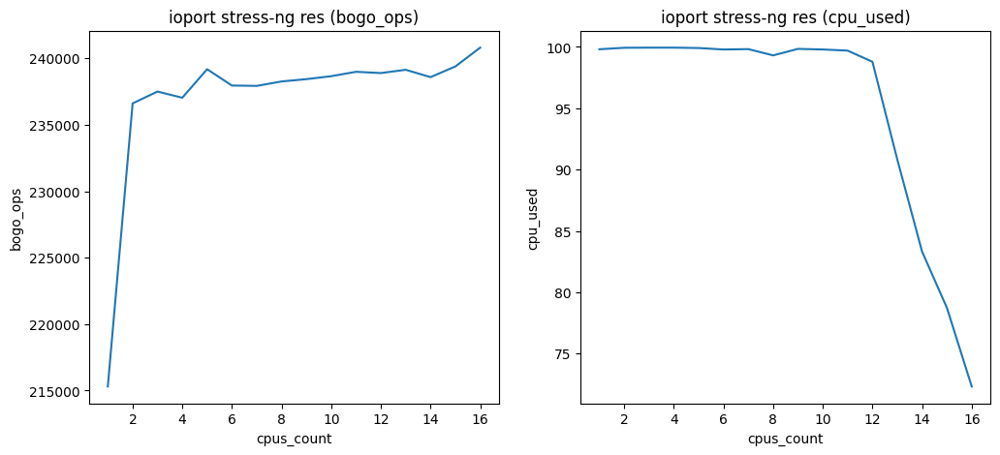

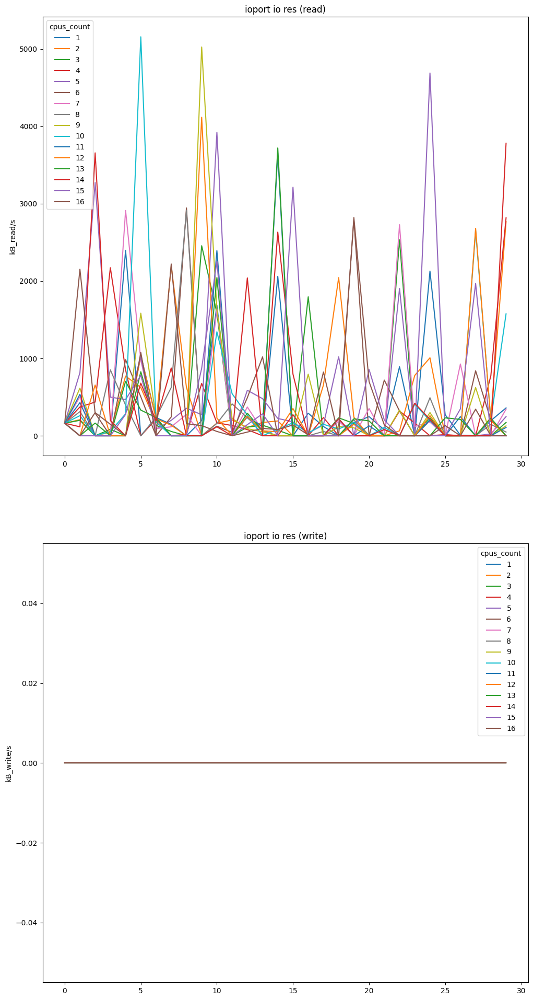

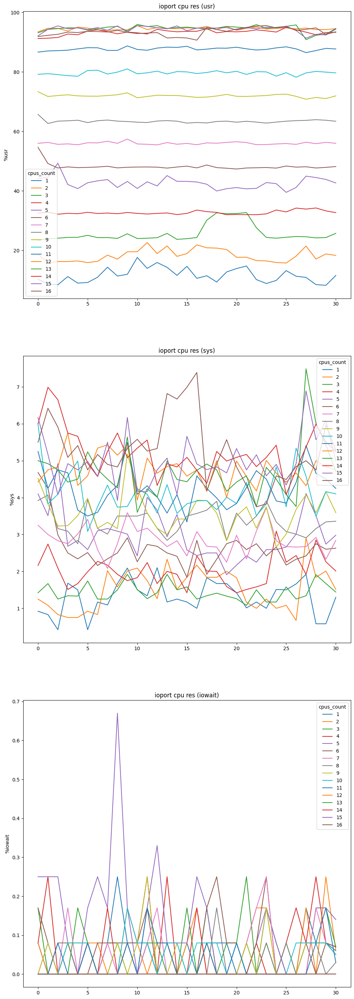

In [174]:
#io ioport
ioport_res = pd.read_csv("itmo_os_lab5/io/ioport_res", delimiter=',')
ioport_io_res = pd.read_csv("itmo_os_lab5/io/ioport_io_res", delimiter=',')
ioport_cpu_res = pd.read_csv("itmo_os_lab5/io/ioport_cpu_res", delimiter=',')

plot_stress_ng_res(ioport_res, "ioport")
plot_io_res(ioport_io_res, "ioport", [i for i in range(1, 17, 1)])
plot_cpu_res(ioport_cpu_res, "ioport", [i for i in range(1, 17, 1)])

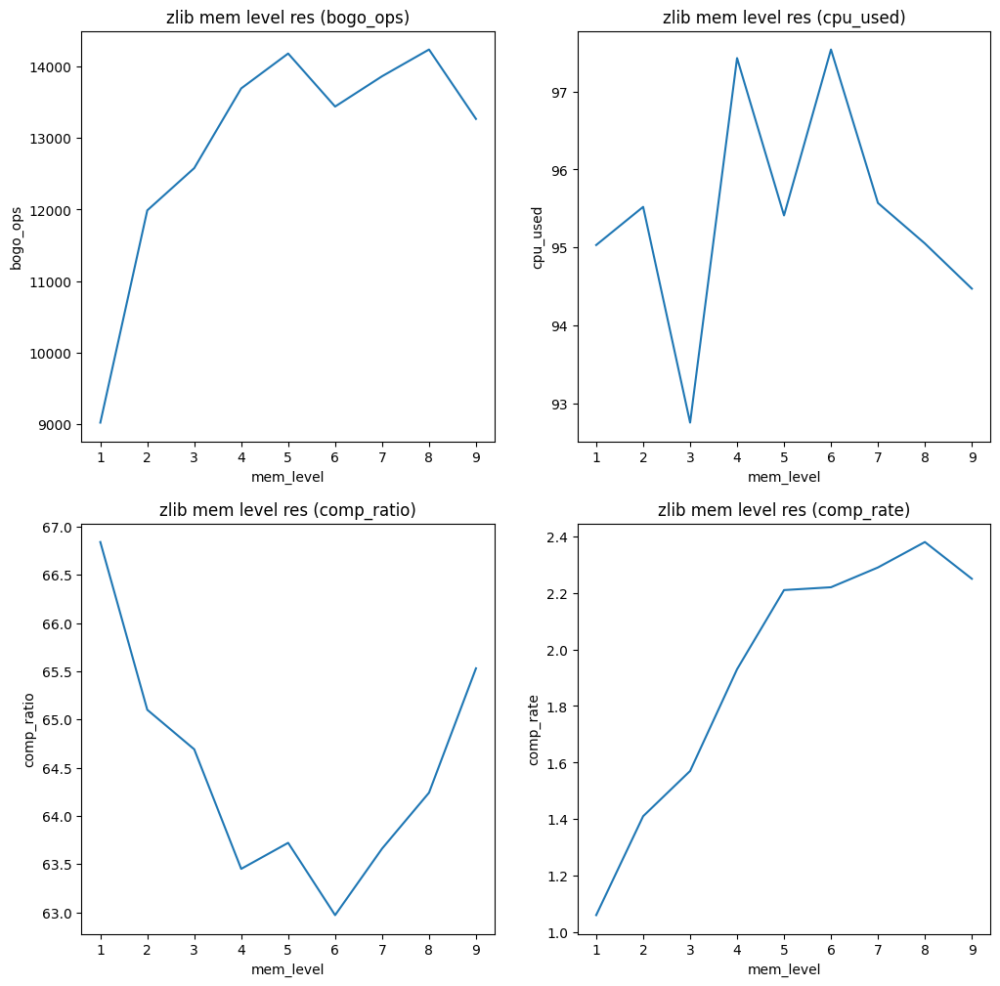

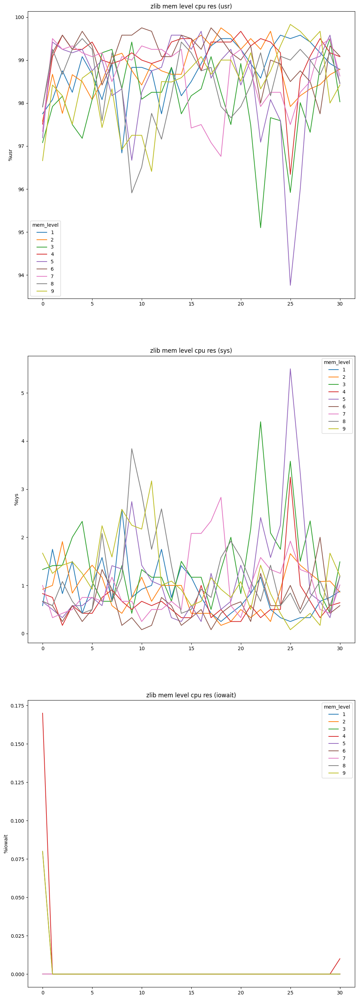

In [175]:
#memory zlib-mem-level
zlib_mem_level_res = pd.read_csv("itmo_os_lab5/memory/zlib-mem-level_res", delimiter=',')
zlib_mem_level_cpu_res = pd.read_csv("itmo_os_lab5/memory/zlib-mem-level_cpu_res", delimiter=',')

plot_mem_level_res(zlib_mem_level_res, "zlib")
plot_mem_level_cpu_res(zlib_mem_level_cpu_res, "zlib", [i for i in range(1, 10, 1)])

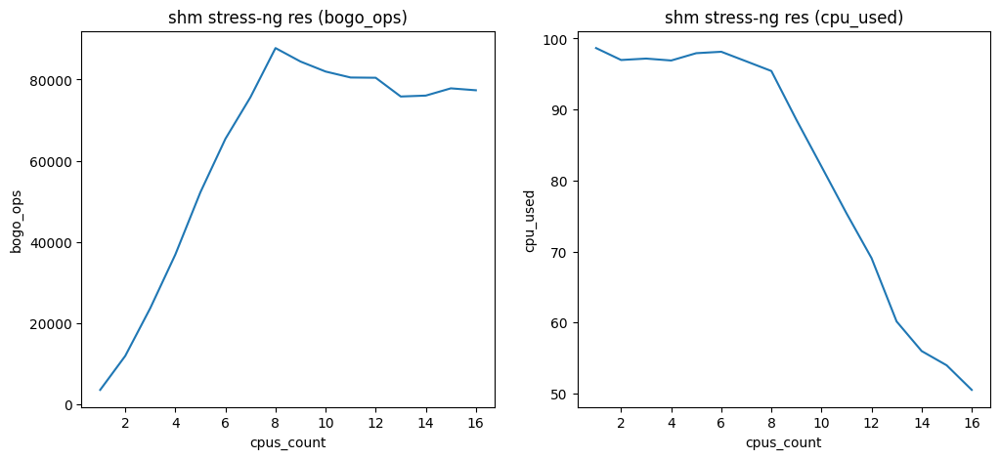

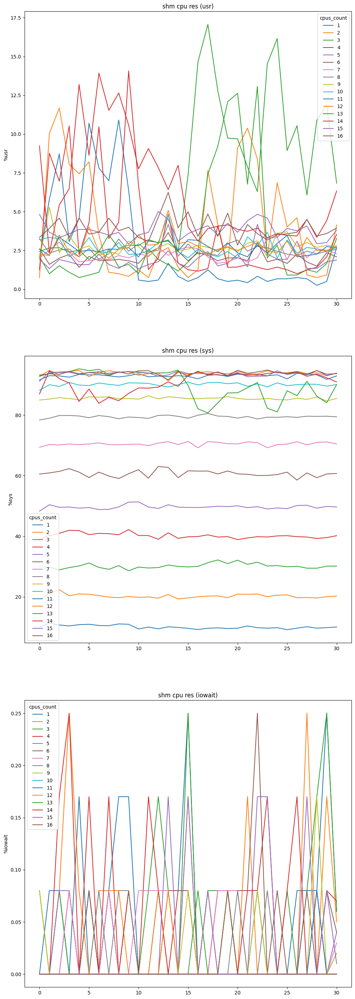

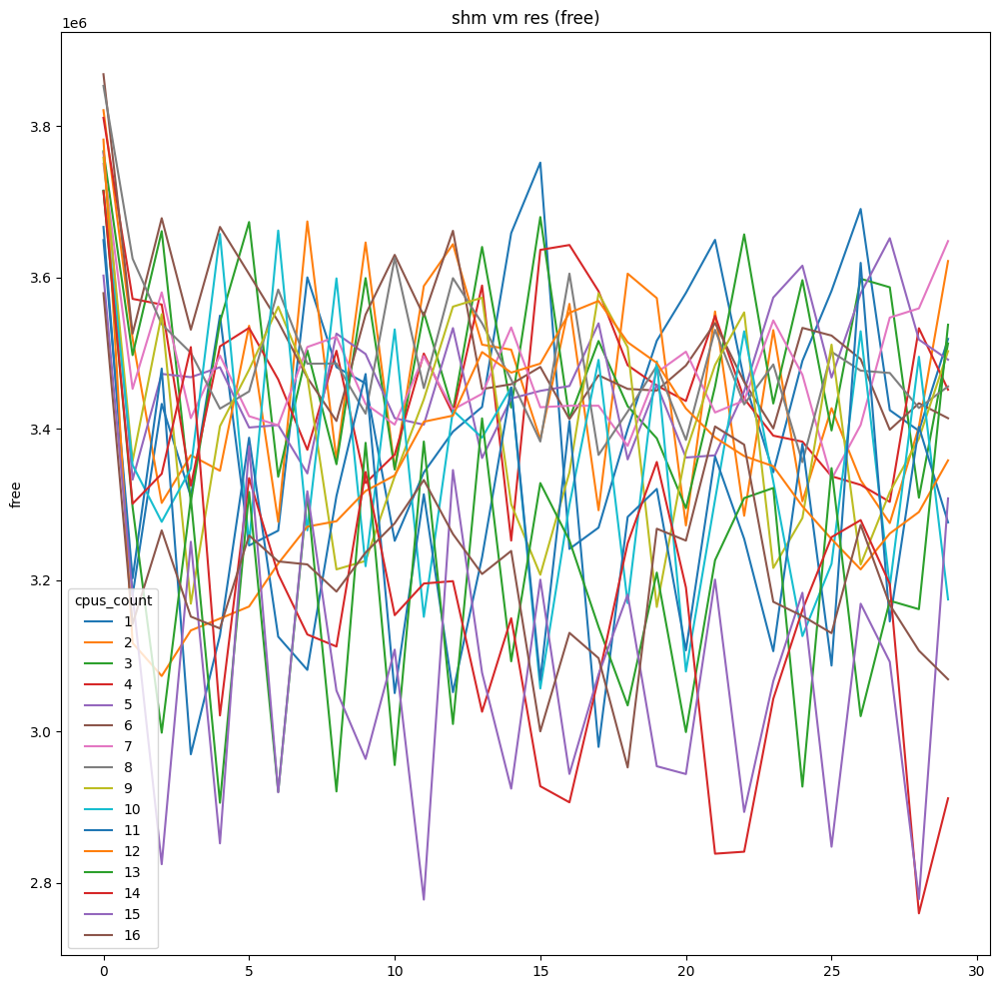

In [176]:
#memory shm
shm_res = pd.read_csv("itmo_os_lab5/memory/shm_res", delimiter=',')
shm_cpu_res = pd.read_csv("itmo_os_lab5/memory/shm_cpu_res", delimiter=',')
shm_vm_res = pd.read_csv("itmo_os_lab5/memory/shm_vm_res", delimiter=',')

plot_stress_ng_res(shm_res, "shm")
plot_cpu_res(shm_cpu_res, "shm", [i for i in range(1, 17, 1)])
plot_vm_res(shm_vm_res, "shm", [i for i in range(1, 17, 1)])

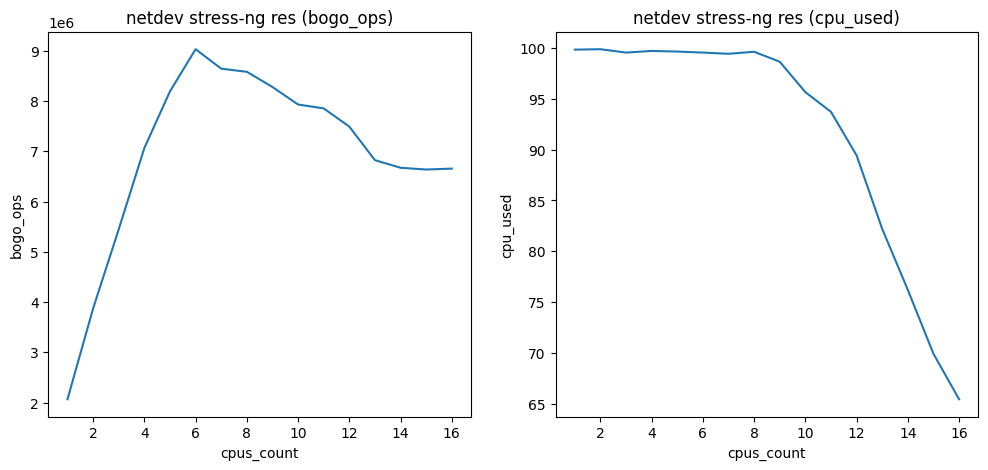

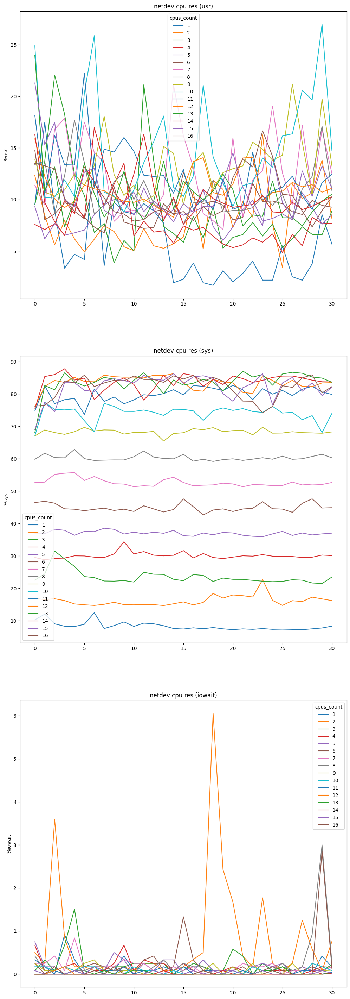

In [177]:
#network netdev
netdev_res = pd.read_csv("itmo_os_lab5/network/netdev_res", delimiter=',')
netdev_cpu_res = pd.read_csv("itmo_os_lab5/network/netdev_cpu_res", delimiter=',')

plot_stress_ng_res(netdev_res, "netdev")
plot_cpu_res(netdev_cpu_res, "netdev", [i for i in range(1, 17, 1)])

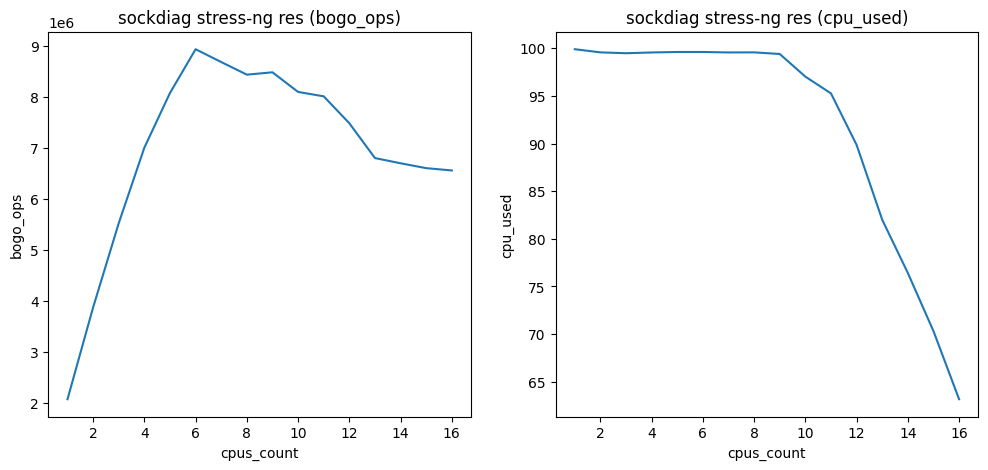

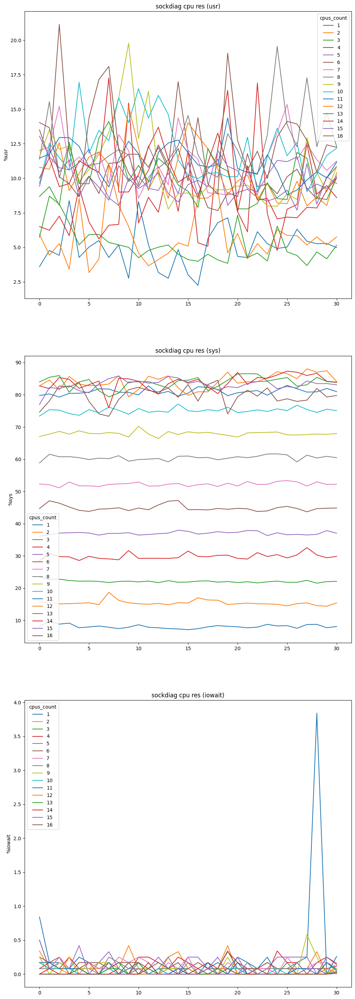

In [178]:
#network sockdiag
sockdiag_res = pd.read_csv("itmo_os_lab5/network/sockdiag_res", delimiter=',')
sockdiag_cpu_res = pd.read_csv("itmo_os_lab5/network/sockdiag_cpu_res", delimiter=',')

plot_stress_ng_res(sockdiag_res, "sockdiag")
plot_cpu_res(sockdiag_cpu_res, "sockdiag", [i for i in range(1, 17, 1)])

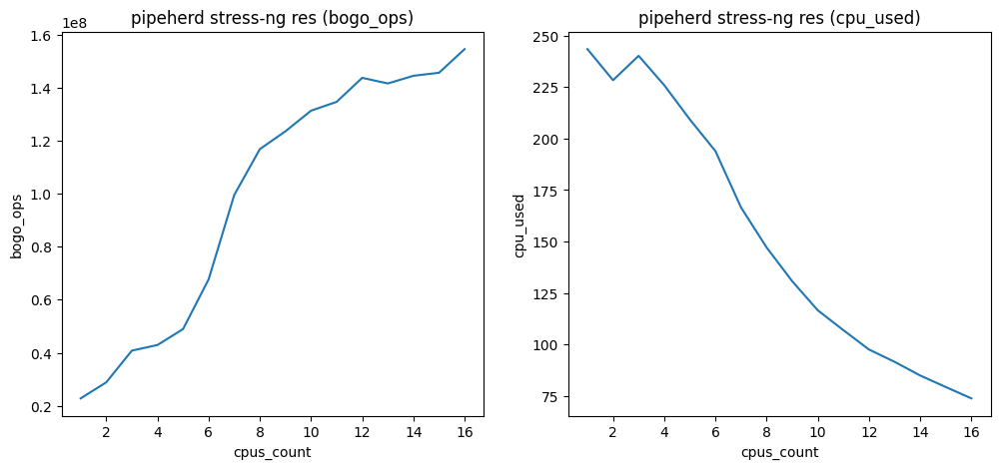

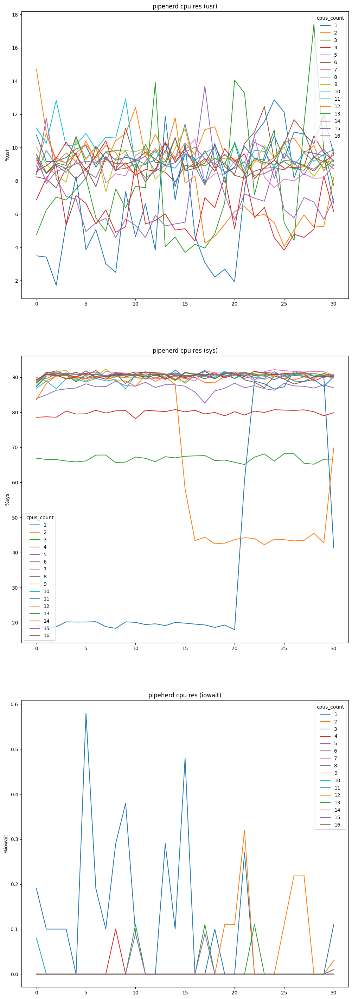

In [180]:
#pipe pipeherd
pipeherd_res = pd.read_csv("itmo_os_lab5/pipe/pipeherd_res", delimiter=',')
pipeherd_cpu_res = pd.read_csv("itmo_os_lab5/pipe/pipeherd_cpu_res", delimiter=',')

plot_stress_ng_res(pipeherd_res, "pipeherd")
plot_cpu_res(pipeherd_cpu_res, "pipeherd", [i for i in range(1, 17, 1)])

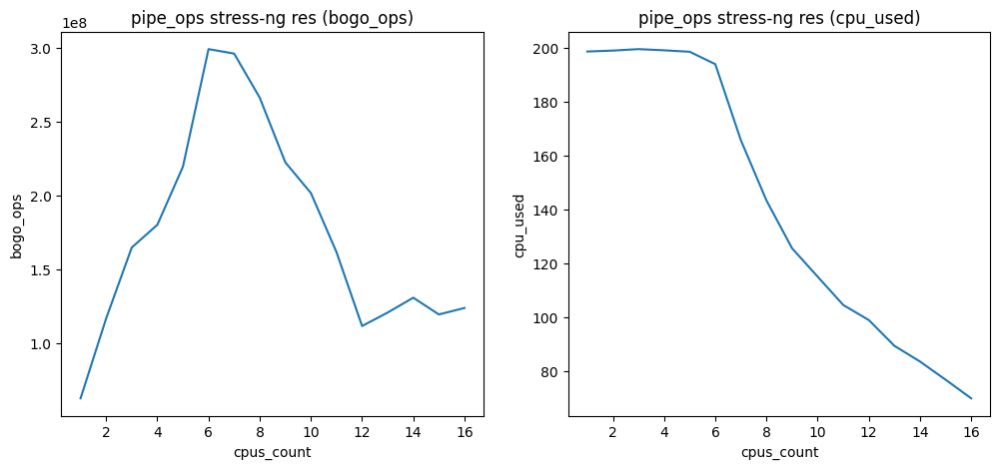

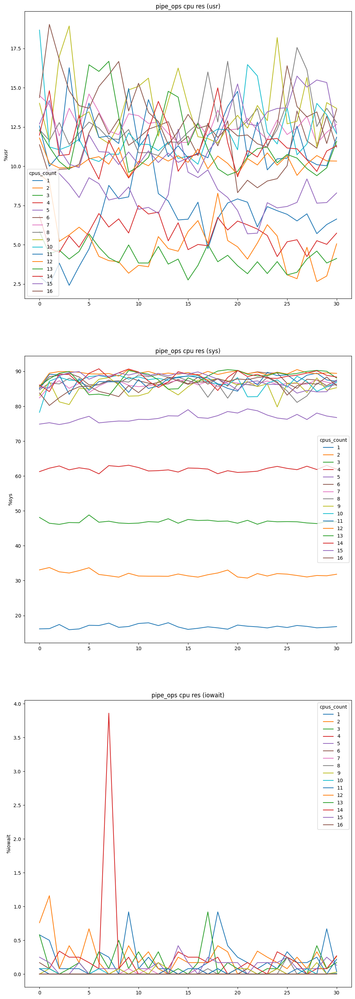

In [183]:
#pipe pipe-ops
pipe_ops_res = pd.read_csv("itmo_os_lab5/pipe/pipe-ops_res", delimiter=',')
pipe_ops_cpu_res = pd.read_csv("itmo_os_lab5/pipe/pipe-ops_cpu_res", delimiter=',')

plot_stress_ng_res(pipe_ops_res, "pipe_ops")
plot_cpu_res(pipe_ops_cpu_res, "pipe_ops", [i for i in range(1, 17, 1)])

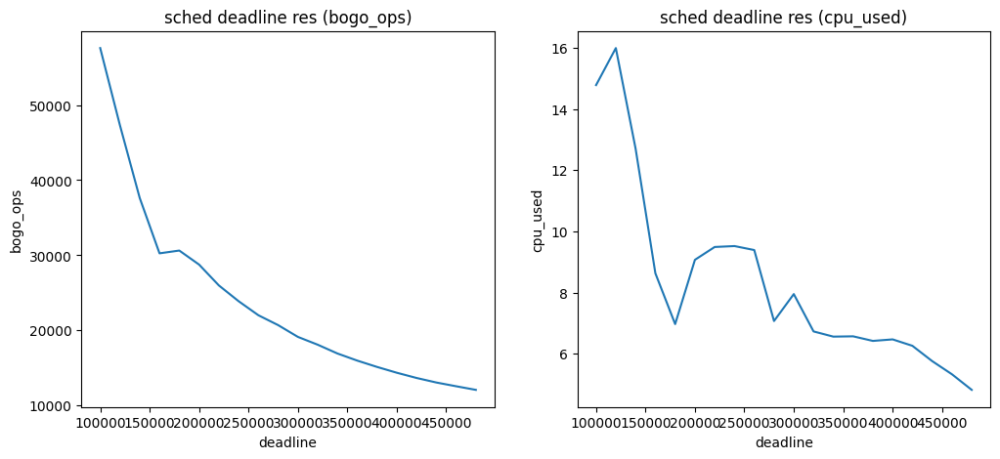

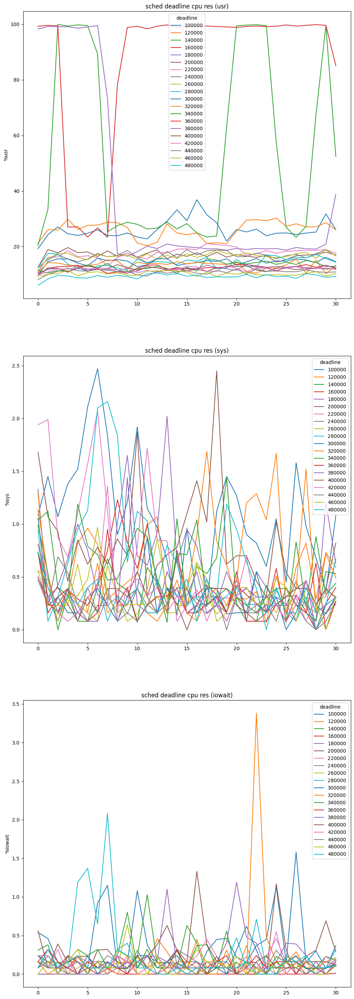

In [184]:
#sched sched-deadline
sched_deadline_res = pd.read_csv("itmo_os_lab5/sched/sched-deadline_res", delimiter=',')
sched_deadline_cpu_res = pd.read_csv("itmo_os_lab5/sched/sched-deadline_cpu_res", delimiter=',')

plot_deadline_res(sched_deadline_res, "sched")
plot_deadline_cpu_res(sched_deadline_cpu_res, "sched", [i for i in range(100000, 500000, 20000)])

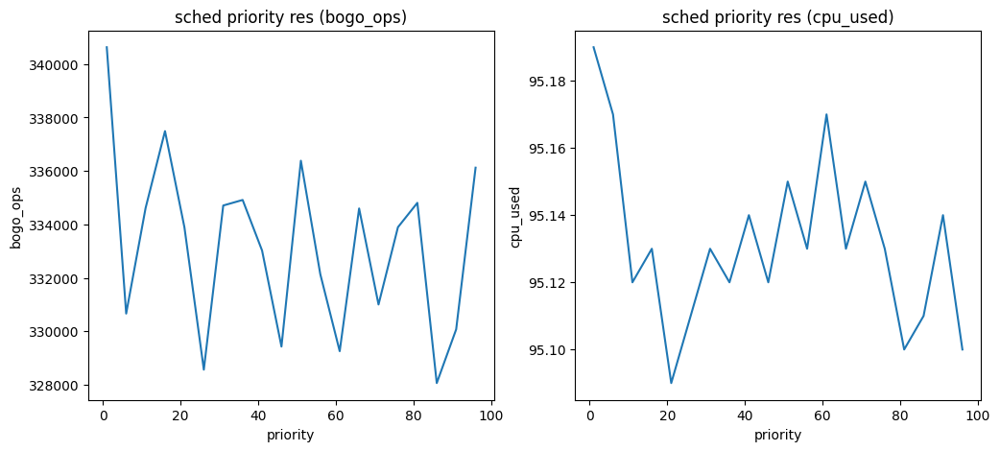

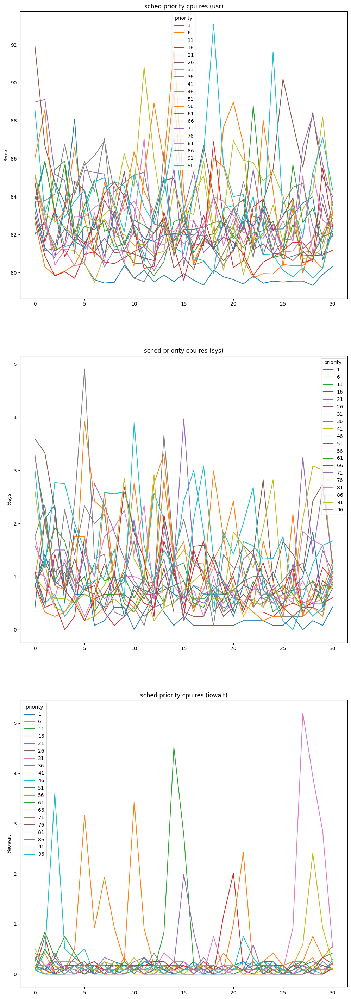

In [185]:
#sched sched-prio
sched_prio_res = pd.read_csv("itmo_os_lab5/sched/sched-prio_res", delimiter=',')
sched_prio_cpu_res = pd.read_csv("itmo_os_lab5/sched/sched-prio_cpu_res", delimiter=',')

plot_priority_res(sched_prio_res, "sched")
plot_priority_cpu_res(sched_prio_cpu_res, "sched", [i for i in range(1, 100, 5)])